In [274]:
#import pandas as pd

#url = 'https://finance.yahoo.com/quote/%5EBSESN?p=%5EBSESN.csv'

#try:
#    data = pd.read_csv(url)
    # Now 'data' contains the contents of the CSV file
#except Exception as e:
#    print("Error:", e)


In [275]:
import yfinance as yf
import pandas as pd
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA
import nltk
import re

from textblob import TextBlob


<h>import first data set</h>

In [348]:
start_date = '2015-01-01'
end_date = '2023-06-30'

data = yf.download('^BSESN', start=start_date, end=end_date)


[*********************100%%**********************]  1 of 1 completed


In [353]:
data.reset_index(inplace=True)


In [278]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       0 non-null      float64
 1   High       0 non-null      float64
 2   Low        0 non-null      float64
 3   Close      0 non-null      float64
 4   Adj Close  0 non-null      float64
 5   Volume     0 non-null      float64
dtypes: float64(6)
memory usage: 0.0+ bytes


In [354]:
data.index

RangeIndex(start=0, stop=2090, step=1)

In [280]:
data.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [281]:
data.isnull().sum()

Open         0.0
High         0.0
Low          0.0
Close        0.0
Adj Close    0.0
Volume       0.0
dtype: float64

Text(0, 0.5, 'BSESN')

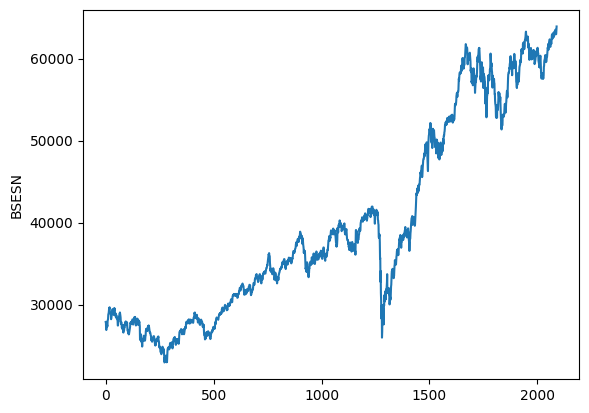

In [355]:
plt.Figure(figsize=(12,6))
data['Close'].plot()
plt.ylabel('BSESN')

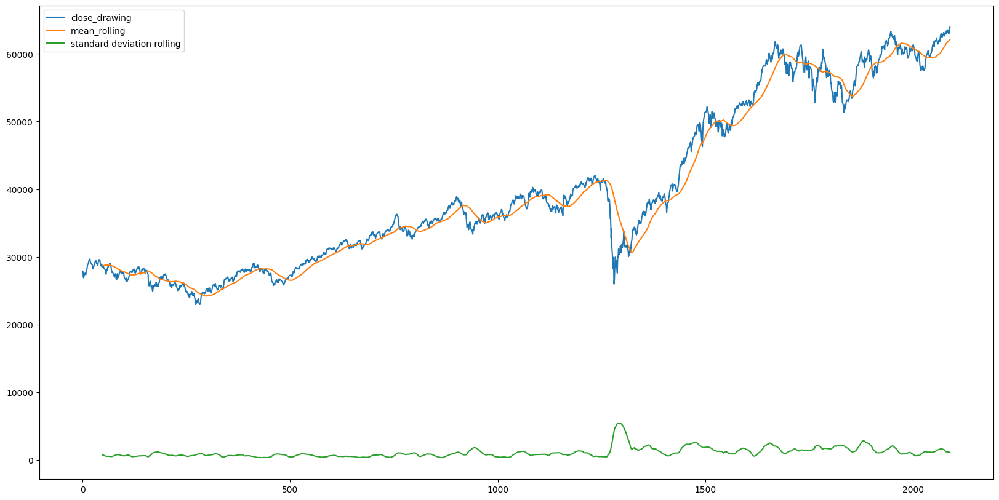

In [356]:
close_draw=data['Close']
mean_draw=close_draw.rolling(window=50).mean()
std_draw=close_draw.rolling(window=50).std()


plt.figure(figsize=(20,10))
close_draw.plot(label='close_drawing')
mean_draw.plot(label='mean_rolling')
std_draw.plot(label='standard deviation rolling')
plt.legend()

<h>correlation matrix</h>

C:\Users\Ali Nabil\AppData\Local\Temp\ipykernel_3928\3738272475.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


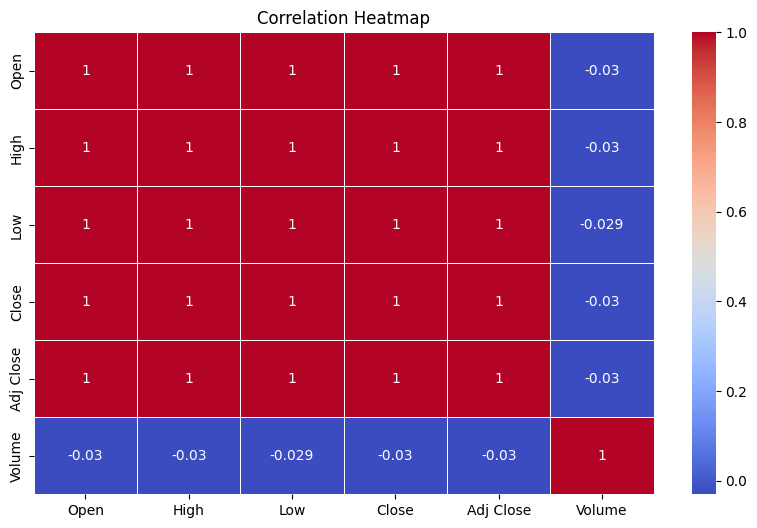

In [357]:
correlation_matrix = data.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


In [285]:
grow_list=[]
for i, j in zip(data['High'], data['Low']):
    grow = ((i - j) / j) * 100
    grow_list.append(grow)

mean_growth=np.mean(grow_list)
print("List of Growth Percentages:")

print(mean_growth)




List of Growth Percentages:
nan


c:\Users\Ali Nabil\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Ali Nabil\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


<h>SHOW WHEN GROW IS LESS THAN 0.5</h>

<h>depend on the date</h>

In [358]:
for i, h in enumerate(grow_list):
    if h < 0.5:
        index_value = data.index[i]  # Get the corresponding index from data
        print(f"Index: {index_value}, Value: {h}")
  

<h>Splite data to train test</h>

In [359]:
train_data = data[:1300]
test_data = data[1300:]


<h>import second dataset 'india news'</h>

In [288]:
data_news=pd.read_csv(r'C:\Users\Ali Nabil\Downloads\india-news-headlines.csv')

In [289]:
data_news.head()

,publish_date,headline_category,headline_text
0,20010102,unknown,Status quo will not be disturbed at Ayodhya; s...
1,20010102,unknown,Fissures in Hurriyat over Pak visit
2,20010102,unknown,America's unwanted heading for India?
3,20010102,unknown,For bigwigs; it is destination Goa
4,20010102,unknown,Extra buses to clear tourist traffic


<h>Date formate</h>

In [290]:
data_news['publish_date']=pd.to_datetime(data_news['publish_date'],format='%Y%m%d')

In [291]:
data_news.rename(columns={'publish_date': 'Date'}, inplace=True)
data_news.head()

,Date,headline_category,headline_text
0,2001-01-02,unknown,Status quo will not be disturbed at Ayodhya; s...
1,2001-01-02,unknown,Fissures in Hurriyat over Pak visit
2,2001-01-02,unknown,America's unwanted heading for India?
3,2001-01-02,unknown,For bigwigs; it is destination Goa
4,2001-01-02,unknown,Extra buses to clear tourist traffic


In [292]:
data_news.isnull().sum()

Date                 0
headline_category    0
headline_text        0
dtype: int64

In [293]:
len(data_news)


3650970

In [294]:
from nltk.corpus import stopwords

In [295]:
data_news.head()

,Date,headline_category,headline_text
0,2001-01-02,unknown,Status quo will not be disturbed at Ayodhya; s...
1,2001-01-02,unknown,Fissures in Hurriyat over Pak visit
2,2001-01-02,unknown,America's unwanted heading for India?
3,2001-01-02,unknown,For bigwigs; it is destination Goa
4,2001-01-02,unknown,Extra buses to clear tourist traffic


In [296]:
data_news['headline_category'].unique()

array(['unknown', 'entertainment.hindi.bollywood', 'india', ...,
       'sports.football.euro-2021', 'business.markets.ipo',
       'sports.tokyo-olympics.india-in-tokyo'], dtype=object)

In [297]:
from textblob import TextBlob

In [298]:
data_news.head()

,Date,headline_category,headline_text
0,2001-01-02,unknown,Status quo will not be disturbed at Ayodhya; s...
1,2001-01-02,unknown,Fissures in Hurriyat over Pak visit
2,2001-01-02,unknown,America's unwanted heading for India?
3,2001-01-02,unknown,For bigwigs; it is destination Goa
4,2001-01-02,unknown,Extra buses to clear tourist traffic


<h>textBlob function </h>

<h>to return 'subjective' and 'polarity'</h>

In [299]:
def get_sentiment(text):
    analysis=TextBlob(text)
    return analysis.sentiment.polarity

data_news['sentiment']=data_news['headline_text'].apply(get_sentiment)

In [361]:
from statsmodels.tsa.stattools import adfuller


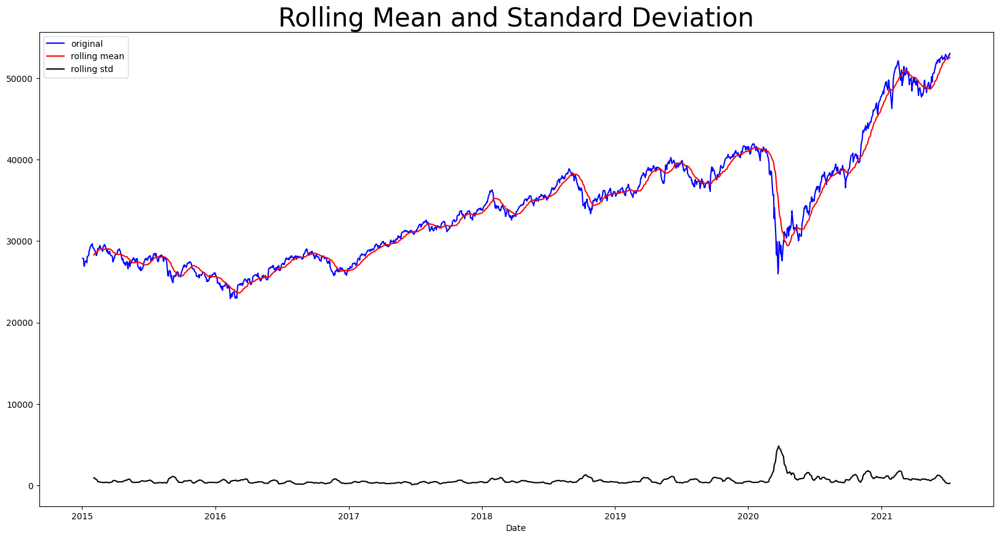

Results of dickey fuller test
ADF Test Statistic : 0.17171574760774777
p-value : 0.9706298449407406
#Lags Used : 12
Number of Observations Used : 1587
Weak evidence against null hypothesis, time series is non-stationary 


In [362]:
def test_stationarity(timeseries):

 rolmean = timeseries.rolling(21).mean()
 rolstd = timeseries.rolling(21).std()

 plt.figure(figsize=(20, 10))
 plt.plot(timeseries, color='blue', label='original')
 plt.plot(rolmean, color='r', label='rolling mean')
 plt.plot(rolstd, color='black', label='rolling std')
 plt.xlabel('Date')
 plt.legend()
 plt.title('Rolling Mean and Standard Deviation',  fontsize=30)
 plt.show(block=False)

 print('Results of dickey fuller test')
 result = adfuller(timeseries, autolag='AIC')
 labels = ['ADF Test Statistic', 'p-value',
           '#Lags Used', 'Number of Observations Used']
 for value, label in zip(result, labels):
   print(label+' : '+str(value))
 if result[1] <= 0.05:
   print("Strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary")
 else:
   print("Weak evidence against null hypothesis, time series is non-stationary ")


test_stationarity(train['Close'])


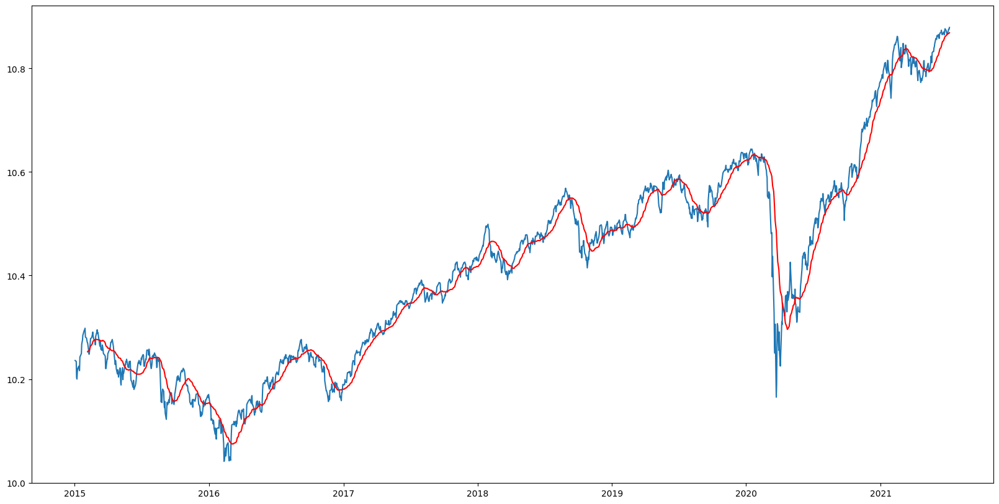

In [363]:
train_log = np.log(train['Close'])
test_log = np.log(test['Close'])

mav = train_log.rolling(24).mean()
plt.figure(figsize=(20, 10))
plt.plot(train_log)
plt.plot(mav, color='red')


In [302]:
data_news['Subjectivity'] = data_news['headline_text'].apply(getSubjectivity)
data_news['Polarity'] = data_news['headline_text'].apply(getPolarity)

In [308]:
import nltk

In [310]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to C:\Users\Ali
[nltk_data]     Nabil\AppData\Roaming\nltk_data...


True

In [311]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Create a SentimentIntensityAnalyzer object
sia = SentimentIntensityAnalyzer()


In [313]:
data_news['Compound'] = [sia.polarity_scores(v)['compound'] for v in data_news['headline_text']]
data_news['Negative'] = [sia.polarity_scores(v)['neg'] for v in data_news['headline_text']]
data_news['Neutral'] = [sia.polarity_scores(v)['neu'] for v in data_news['headline_text']]
data_news['Positive'] = [sia.polarity_scores(v)['pos'] for v in data_news['headline_text']]


In [325]:
data_news

,Date,headline_category,headline_text,sentiment,Subjectivity,Polarity,Compound,Negative,Neutral,Positive
0,2001-01-02,unknown,Status quo will not be disturbed at Ayodhya; s...,0.000000,0.000000,0.000000,0.2924,0.000,0.805,0.195
1,2001-01-02,unknown,Fissures in Hurriyat over Pak visit,0.000000,0.000000,0.000000,0.0000,0.000,1.000,0.000
2,2001-01-02,unknown,America's unwanted heading for India?,0.000000,0.000000,0.000000,-0.2263,0.322,0.678,0.000
3,2001-01-02,unknown,For bigwigs; it is destination Goa,0.000000,0.000000,0.000000,0.0000,0.000,1.000,0.000
4,2001-01-02,unknown,Extra buses to clear tourist traffic,0.050000,0.241667,0.050000,0.3818,0.000,0.658,0.342
...,...,...,...,...,...,...,...,...,...,...
3650965,2022-03-31,city.srinagar,J&K sacks 2 cops; 3 other employees over terro...,-0.125000,0.375000,-0.125000,-0.5267,0.327,0.673,0.000
3650966,2022-03-31,entertainment.hindi.bollywood,Ranbir Kapoor says 'Rishi Kapoor enjoyed his a...,0.100000,0.550000,0.100000,0.5106,0.000,0.852,0.148
3650967,2022-03-31,city.trichy,As Covid-19 cases drop to nil in southern dist...,0.000000,0.000000,0.000000,-0.2732,0.123,0.877,0.000
3650968,2022-03-31,city.erode,Tamil Nadu sees marginal rise of Covid cases w...,0.136364,0.454545,0.136364,0.0000,0.000,1.000,0.000


In [351]:
merge_data=pd.merge(data,data_news,how='inner',on='Date')

In [352]:
merge_data

,Date,Open,High,Low,Close,Adj Close,Volume,headline_category,headline_text,sentiment,Subjectivity,Polarity,Compound,Negative,Neutral,Positive
0,2015-01-02,27521.279297,27937.470703,27519.259766,27887.900391,27887.900391,7400,life-style.food.drinks-corner,Drink smart with these party tips,0.214286,0.642857,0.214286,0.6597,0.000,0.426,0.574
1,2015-01-02,27521.279297,27937.470703,27519.259766,27887.900391,27887.900391,7400,life-style.relationships.parenting,How to say sorry to your kid,-0.500000,1.000000,-0.500000,-0.0772,0.178,0.822,0.000
2,2015-01-02,27521.279297,27937.470703,27519.259766,27887.900391,27887.900391,7400,life-style.relationships.parenting,Where to take your child on weekends,0.000000,0.000000,0.000000,0.0000,0.000,1.000,0.000
3,2015-01-02,27521.279297,27937.470703,27519.259766,27887.900391,27887.900391,7400,life-style.health-fitness.diet,Why Mediterranean diet is good for your heart,0.700000,0.600000,0.700000,0.4404,0.000,0.707,0.293
4,2015-01-02,27521.279297,27937.470703,27519.259766,27887.900391,27887.900391,7400,life-style.relationships.work,The employee gifting guide,0.000000,0.000000,0.000000,0.0000,0.000,1.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1085217,2022-03-31,58779.710938,58890.921875,58485.789062,58568.511719,58568.511719,4400,city.srinagar,J&K sacks 2 cops; 3 other employees over terro...,-0.125000,0.375000,-0.125000,-0.5267,0.327,0.673,0.000
1085218,2022-03-31,58779.710938,58890.921875,58485.789062,58568.511719,58568.511719,4400,entertainment.hindi.bollywood,Ranbir Kapoor says 'Rishi Kapoor enjoyed his a...,0.100000,0.550000,0.100000,0.5106,0.000,0.852,0.148
1085219,2022-03-31,58779.710938,58890.921875,58485.789062,58568.511719,58568.511719,4400,city.trichy,As Covid-19 cases drop to nil in southern dist...,0.000000,0.000000,0.000000,-0.2732,0.123,0.877,0.000
1085220,2022-03-31,58779.710938,58890.921875,58485.789062,58568.511719,58568.511719,4400,city.erode,Tamil Nadu sees marginal rise of Covid cases w...,0.136364,0.454545,0.136364,0.0000,0.000,1.000,0.000


In [365]:
model_data = merge_data[['Close','Subjectivity', 'Polarity', 'Compound', 'Negative', 'Neutral', 'Positive']]

In [366]:
model_data.head()

,Close,Subjectivity,Polarity,Compound,Negative,Neutral,Positive
0,27887.900391,0.642857,0.214286,0.6597,0.000,0.426,0.574
1,27887.900391,1.000000,-0.500000,-0.0772,0.178,0.822,0.000
2,27887.900391,0.000000,0.000000,0.0000,0.000,1.000,0.000
3,27887.900391,0.600000,0.700000,0.4404,0.000,0.707,0.293
4,27887.900391,0.000000,0.000000,0.0000,0.000,1.000,0.000


<h>normalize data</h>

In [367]:
from sklearn.preprocessing import MinMaxScaler

In [368]:
scaler = MinMaxScaler()

df = pd.DataFrame(scaler.fit_transform(model_data))
df.columns = model_data.columns
df.index = model_data.index
df.head()


,Close,Subjectivity,Polarity,Compound,Negative,Neutral,Positive
0,0.127173,0.642857,0.607143,0.847078,0.000,0.426,0.574
1,0.127173,1.000000,0.250000,0.463914,0.178,0.822,0.000
2,0.127173,0.000000,0.500000,0.504056,0.000,1.000,0.000
3,0.127173,0.600000,0.850000,0.733049,0.000,0.707,0.293
4,0.127173,0.000000,0.500000,0.504056,0.000,1.000,0.000


In [ ]:
#data['Date'] = data.index 
#data_news = data_news.set_index('publish_date')

#merged_data = pd.merge(data_news, data, left_index=True,
#                       right_index=True, how='inner')

In [372]:
X = df.drop('Close', axis=1)
X


,Subjectivity,Polarity,Compound,Negative,Neutral,Positive
0,0.642857,0.607143,0.847078,0.000,0.426,0.574
1,1.000000,0.250000,0.463914,0.178,0.822,0.000
2,0.000000,0.500000,0.504056,0.000,1.000,0.000
3,0.600000,0.850000,0.733049,0.000,0.707,0.293
4,0.000000,0.500000,0.504056,0.000,1.000,0.000
...,...,...,...,...,...,...
1085217,0.375000,0.437500,0.230189,0.327,0.673,0.000
1085218,0.550000,0.550000,0.769551,0.000,0.852,0.148
1085219,0.000000,0.500000,0.362001,0.123,0.877,0.000
1085220,0.454545,0.568182,0.504056,0.000,1.000,0.000


In [373]:
Y = df['Close']
Y


0          0.127173
1          0.127173
2          0.127173
3          0.127173
4          0.127173
             ...   
1085217    0.917630
1085218    0.917630
1085219    0.917630
1085220    0.917630
1085221    0.917630
Name: Close, Length: 1085222, dtype: float64

<h>SPLITE THE DATA</h>

In [374]:
from sklearn.model_selection import train_test_split

In [375]:
x_train, x_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.2, random_state=0)
x_train.shape

(868177, 6)

<h>CORRELATION BETWEEN SETIMENT</h>

<H>Correlation Analysis</H>

In [371]:
correlation = merged_data['sentiment'].corr(merged_data['Close'])
print(correlation)


-0.012046315524259603


<h>RANDOM FOREST</h>

In [376]:
from sklearn.ensemble import RandomForestRegressor

In [379]:
RF = RandomForestRegressor()
RF.fit(x_train, y_train)
prediction=RF.predict(x_test)

In [7]:
prediction=RF.predict(x_test)

NameError: name 'RF' is not defined

In [382]:
for i,j in zip(y_test,prediction):
    print(i,j)

0.13961568779596267 0.31428427562707123
0.21306333404536737 0.31428427562707123
0.7635663496228106 0.41687182131105627
0.015517410993856062 0.31505282421304914
0.3282518758826517 0.3474962360174823
0.05971620788274534 0.30629975831012735
0.47331590736914986 0.3670464608192451
0.21501908779631496 0.1261301322496325
0.11907710322405496 0.3402198551759094
0.09722762118479944 0.31428427562707123
0.4066702243209195 0.41623147997171855
0.10182675733401358 0.31600119913115843
0.21691506087891166 0.3577267590061265
0.9252064332654258 0.33297639081987923
0.07467637045798381 0.24820220993383438
0.7568625615764787 0.31428427562707123
0.1705376913843124 0.31428427562707123
0.12959014766277965 0.2919340689226027
0.13855573830257617 0.2920799847940052
0.3843327850922713 0.4804996421030209
0.4880029306617212 0.3568109857545384
0.07750342241810282 0.31428427562707123
0.6566215518870285 0.31428427562707123
0.2295899715412819 0.3617242805346938
0.2910107335988742 0.2813911966178547
0.3215498993717243 0.

In [5]:
from sklearn.metrics import mean_squared_error

NameError: name 'model' is not defined

In [6]:
mse=(mean_squared_error(prediction, y_test))

NameError: name 'prediction' is not defined

<h>Decision Tree</h>

In [8]:
from sklearn.tree import DecisionTreeRegressor


In [ ]:
d_tree = DecisionTreeRegressor()

d_tree.fit(x_train, y_train)
predictions_tree =d_tree.predict(x_test)

In [ ]:
for i,j in zip(y_test,predictions_tree):
    print(i,j)

In [ ]:
msed_tree = (mean_squared_error(predictions_tree, y_test))
print(msed_tree)
